In [1]:
%load_ext autoreload
%autoreload 2

In [5]:
from tqdm import tqdm
import sys
cluster_path = '/fs/cbsuvlaminck2'
sys.path.append(cluster_path + '/workdir/bmg224/hiprfish/image_analysis_code')
import image_functions as imfn
from segmentation import Segmentation

In [6]:
data_dir = cluster_path + '/workdir/bmg224/data/2021/brc_fileshare_new/2021_06_02_plasmidairyscan/processed'
sample_names = imfn.get_sample_names(data_dir=data_dir)
refl = ['gfp', 'cy5']
factors = ['exp','method', 'plasmid','fov']
flat_field_filename = ''
print(len(sample_names))
print(sample_names[0])

47
2021_06_02_plasmidairyscan_exp_080220_method_a_plasmid_neg_fov_tile2_Airyscan_Processing_Stitch


In [7]:
keys =[imfn.get_filename_keys(sn, factors) for sn in sample_names]
len(keys)

47

In [8]:
for sn, k in zip(sample_names, keys):
    if k[1] == 'b':
        print(sn[27:-27], k)

exp_080220_method_b_plasmid_neg_fov_tile3 ['080220', 'b', 'neg', 'tile3']
exp_040421_method_b_plasmid_neg_fov_tile3 ['040421', 'b', 'neg', 'tile3']
exp_040421_method_b_plasmid_neg_fov_tile1 ['040421', 'b', 'neg', 'tile1']
exp_080220_method_b_plasmid_pos_fov_tile1 ['080220', 'b', 'pos', 'tile1']
exp_040421_method_b_plasmid_pos_fov_tile3 ['040421', 'b', 'pos', 'tile3']
exp_080220_method_b_plasmid_neg_fov_tile2 ['080220', 'b', 'neg', 'tile2']
exp_040421_method_b_plasmid_pos_fov_tile2 ['040421', 'b', 'pos', 'tile2']
exp_080220_method_b_plasmid_neg_fov_tile1 ['080220', 'b', 'neg', 'tile1']
exp_080220_method_b_plasmid_pos_fov_tile2 ['080220', 'b', 'pos', 'tile2']
exp_040421_method_b_plasmid_neg_fov_tile2 ['040421', 'b', 'neg', 'tile2']
exp_040421_method_b_plasmid_pos_fov_tile1 ['040421', 'b', 'pos', 'tile1']
exp_080220_method_b_plasmid_pos_fov_tile3 ['080220', 'b', 'pos', 'tile3']


In [9]:
for i, k in enumerate(keys): 
    if k[1] == 'g': print(i,k)

4 ['040421', 'g', 'neg', 'tile2']
7 ['040421', 'g', 'pos', 'tile1']
10 ['040421', 'g', 'pos', 'tile2']
32 ['040421', 'g', 'neg', 'tile1']
33 ['040421', 'g', 'neg', 'tile3']
37 ['040421', 'g', 'pos', 'tile3']


In [21]:
import os
raw_filenames = [data_dir + '/' + sn + '.czi' for sn in sample_names]
print(os.path.exists(raw_filenames[0]))
sn = sample_names[7]
print(sn)

True
2021_06_02_plasmidairyscan_exp_040421_method_g_plasmid_pos_fov_tile1_Airyscan_Processing_Stitch


In [22]:
seg = Segmentation(sample_name=sn, illumination_names=refl, data_dir=data_dir, fname_mod='_cell_seg')

In [23]:
seg.pick_channel('gfp')

In [24]:
seg.segment()

(2000, 2000)


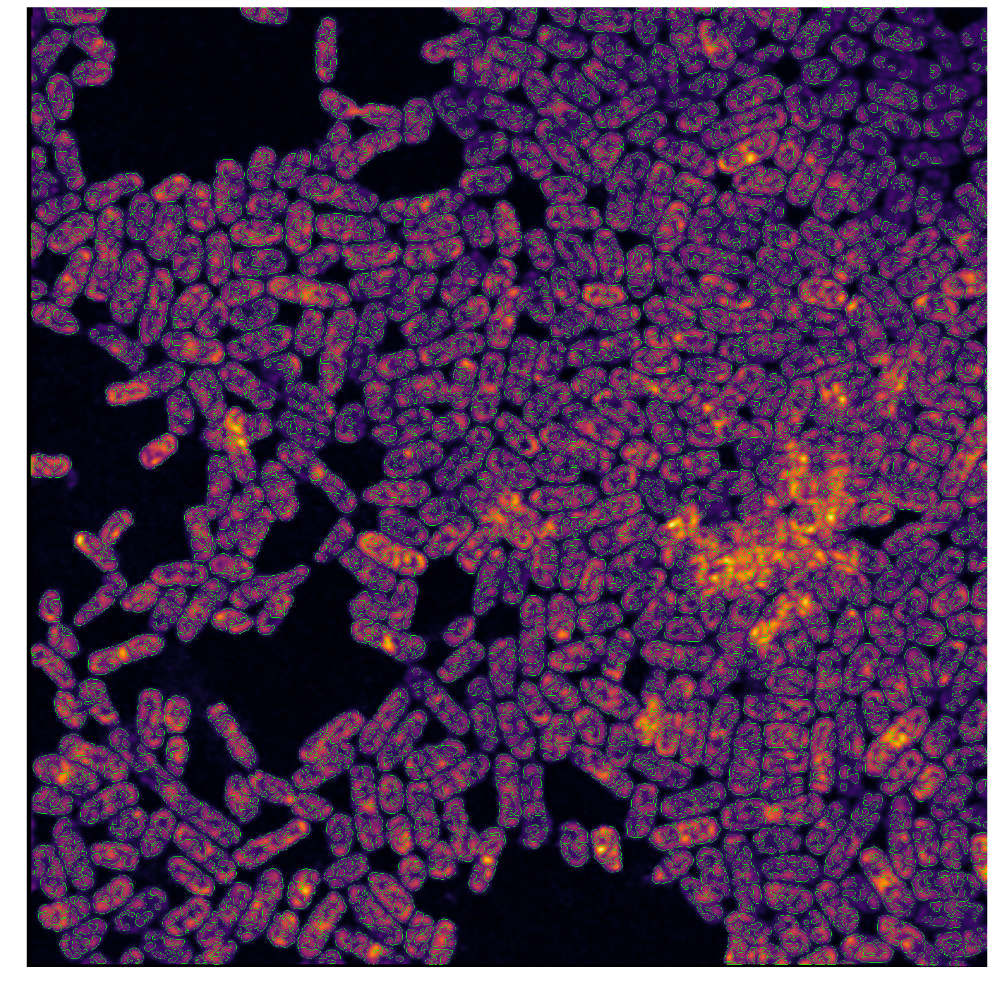

In [25]:
seg.save_seg(save=False, dims=(20,20), clims=('min','max'))

(1529, 1829, 994, 1294)


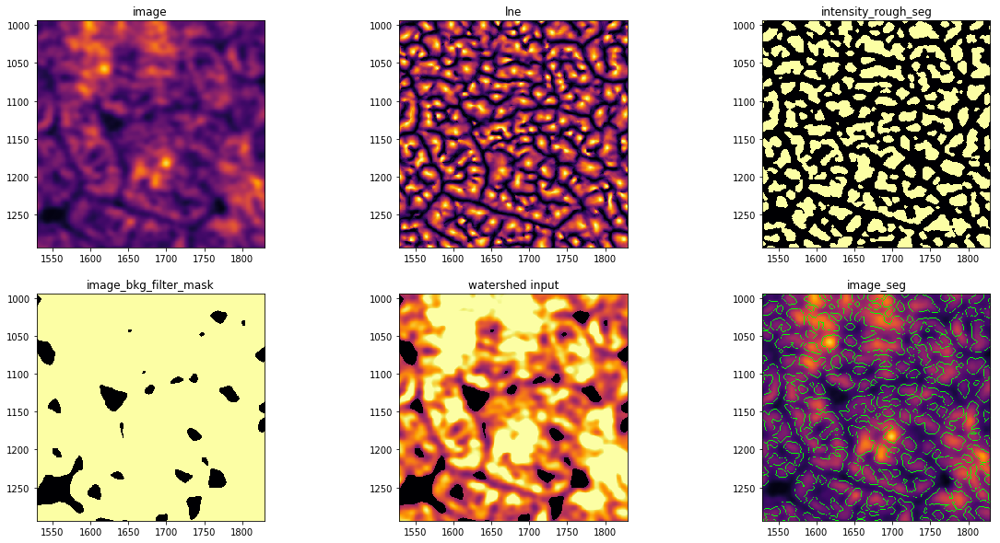

In [26]:
import pandas as pd
zc = pd.read_csv(seg.zoom_coords_filename).values[0][1:]
print(tuple(zc))
seg.save_seg_process(save=False, dims=(20,10), clims=('min','max'), zoom_coords=zc)

(2000, 2000)


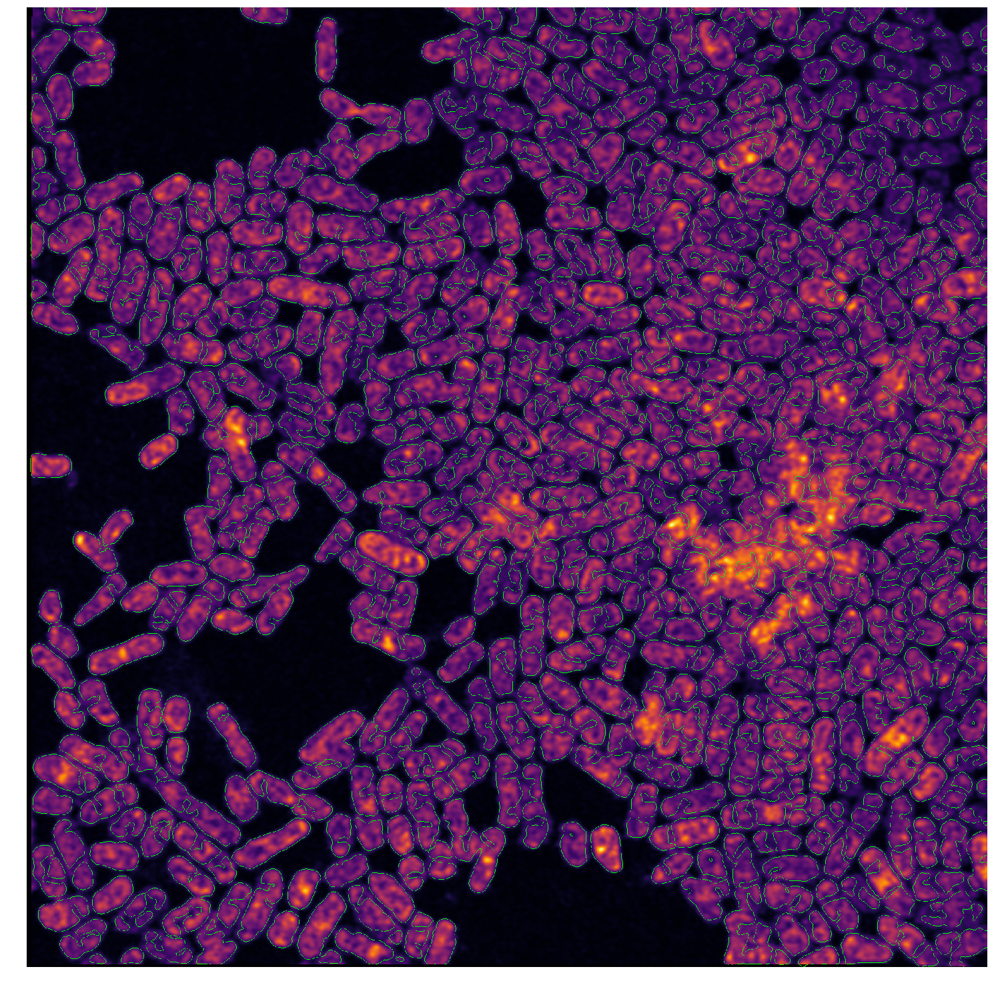

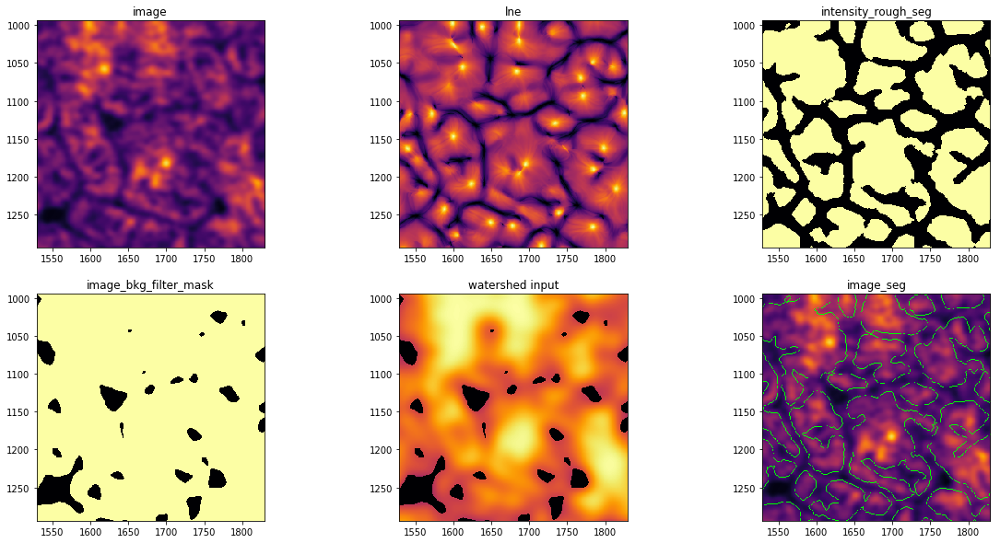

In [27]:
seg = Segmentation(sample_name=sn, illumination_names=refl, data_dir=data_dir, fname_mod='_cell_seg', lne_smoothing=10)
seg.pick_channel('gfp')
seg.segment()
seg.save_seg(save=False, dims=(20,20), clims=('min','max'))
seg.save_seg_process(save=False, dims=(20,10), clims=('min','max'), zoom_coords=zc)


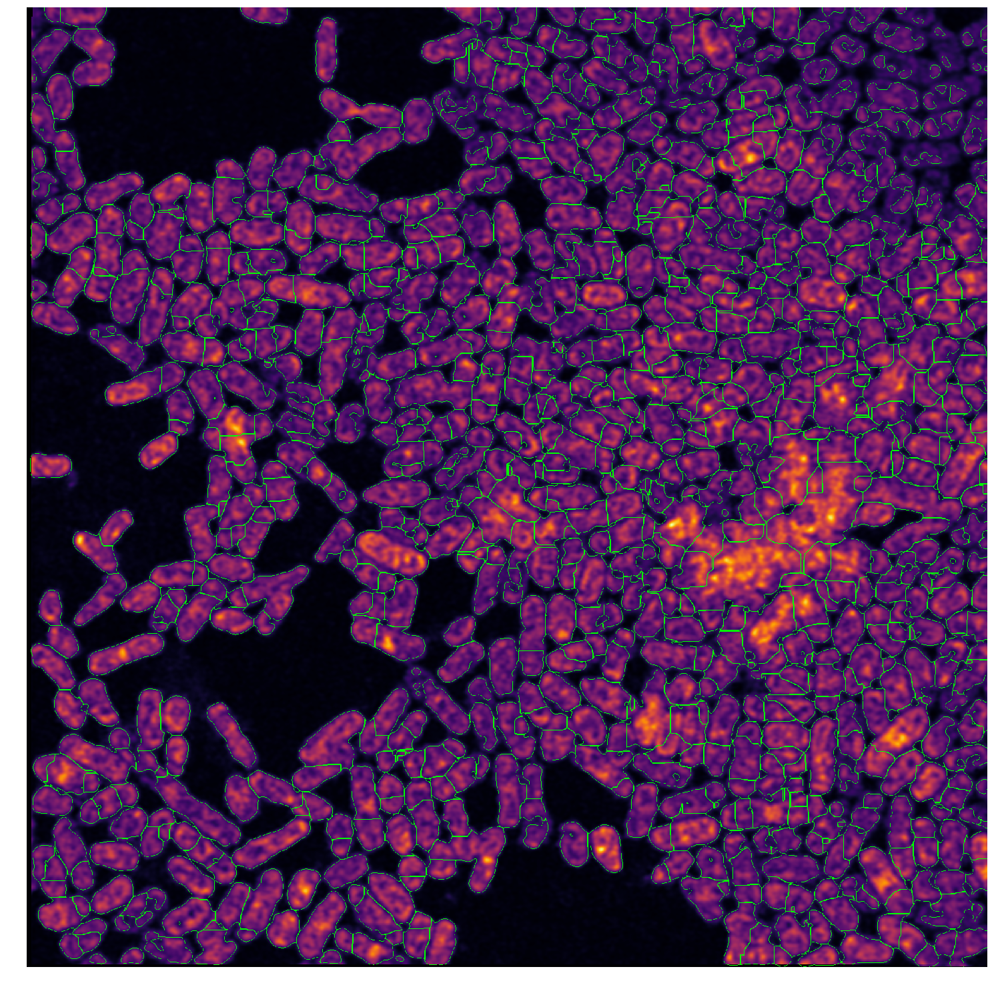

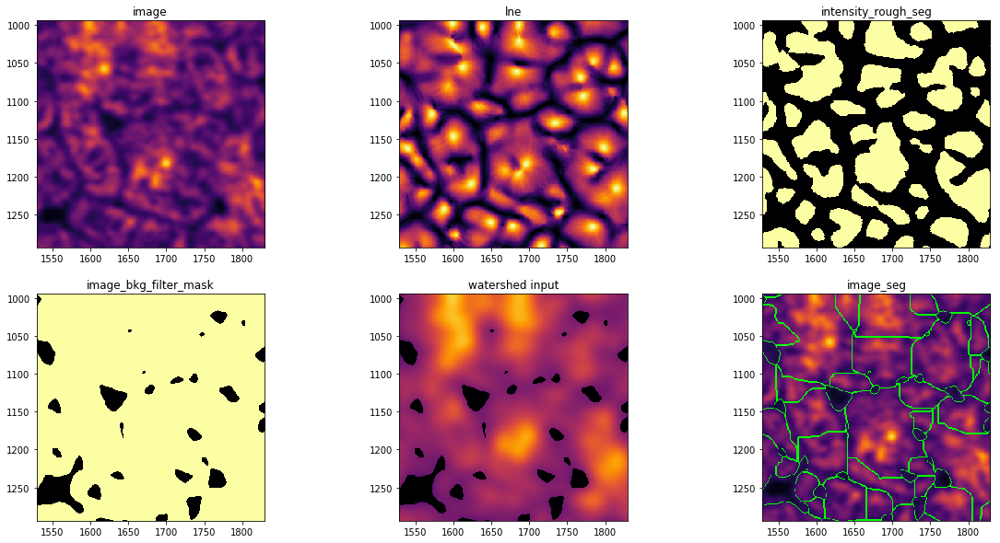

In [35]:
seg = Segmentation(sample_name=sn, illumination_names=refl, data_dir=data_dir, 
                   fname_mod='_cell_seg', lne_smoothing=10, window=10)
seg.pick_channel('gfp')
seg.segment()
seg.save_seg(save=False, dims=(20,20), clims=('min','max'))
seg.save_seg_process(save=False, dims=(20,10), clims=('min','max'), zoom_coords=zc)


In [18]:
seg.measure_regionprops()
props = pd.read_csv(seg.region_props_filename)


/home/bmg224/miniconda3/envs/hiprfish_imaging/lib/python3.5/site-packages/skimage/measure/_regionprops.py:250: UserWarning: regionprops and image moments (including moments, normalized moments, central moments, and inertia tensor) of 2D images will change from xy coordinates to rc coordinates in version 0.16.
See https://scikit-image.org/docs/0.14.x/release_notes_and_installation.html#deprecations for details on how to avoid this message.
  warn(XY_TO_RC_DEPRECATION_MESSAGE)
/home/bmg224/miniconda3/envs/hiprfish_imaging/lib/python3.5/site-packages/skimage/measure/_regionprops.py:260: UserWarning: regionprops and image moments (including moments, normalized moments, central moments, and inertia tensor) of 2D images will change from xy coordinates to rc coordinates in version 0.16.
See https://scikit-image.org/docs/0.14.x/release_notes_and_installation.html#deprecations for details on how to avoid this message.
  warn(XY_TO_RC_DEPRECATION_MESSAGE)


In [19]:
print(props.major_axis_length[:10])
print(props.minor_axis_length[:10])

0    149.017844
1    187.808078
2    282.338362
3    185.312003
4     69.185088
5     75.786996
6    134.099880
7    128.225630
8    176.616452
9    114.152417
Name: major_axis_length, dtype: float64
0     79.735981
1     86.374170
2    128.454294
3     87.733969
4     37.621401
5     58.462164
6    107.366214
7     83.543896
8     87.283119
9     77.248026
Name: minor_axis_length, dtype: float64


In [20]:
from skimage

SyntaxError: invalid syntax (<ipython-input-20-1ceb51599919>, line 1)